In [1]:
import pickle
import numpy as np
import pandas as pd
import math
from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sqlalchemy import create_engine
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import sys
import os

In [2]:
sys.path.append(os.path.abspath(os.path.join('../script')))

In [3]:
from selector1 import *
from visualizer2 import *
from outlier import Outlier

### Reading Data

In [7]:
univariate_analysis = pd.read_csv("../data/univariate_analysis.csv")
univariate_analysis.head()

,Unnamed: 0,cluster,MSISDN/Number,Dur. (ms),Total Data Volume (Bytes),Bearer Id,no.xdr_session
0,0,2,3.360304e+10,324384.875,1.603151e+09,821,3.5
1,1,1,3.360304e+10,145911.000,6.913349e+08,1,1.0
2,2,1,3.360304e+10,98245.000,5.407650e+08,1,1.0
3,3,1,3.360304e+10,86350.000,2.796330e+08,1,1.0
4,4,2,3.360304e+10,172150.000,1.177222e+09,2,2.0


In [8]:
user_experience_df = pd.read_csv("../data/user_experience_data.csv")
user_experience_df.head()

,MSISDN/Number,cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes)
0,3.360304e+10,1,236.5,61922.375,11329409.25
1,3.360304e+10,2,40.0,102.000,7488492.00
2,3.360304e+10,2,35.0,106.000,7824628.25
3,3.360304e+10,0,129.0,1529.000,12932.00
4,3.360304e+10,1,104.5,52836.000,2772426.00


### Engagement Score

In [10]:
eng_df = univariate_analysis.set_index('MSISDN/Number')[
    ['no.xdr_session', 'Dur. (ms)', 'Total Data Volume (Bytes)']]

In [11]:
# scale data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(eng_df)
scaled_data

array([[ 3.31037432,  2.30531842,  2.38764305],
       [-0.54773564,  0.20371837,  0.07435463],
       [-0.54773564, -0.35756752, -0.30764296],
       ...,
       [-0.54773564, -0.73673518, -0.45909895],
       [-0.54773564,  1.00795417, -0.67807582],
       [ 3.31037432,  2.30531842,  2.38764305]])

In [12]:
normalized_data = normalize(scaled_data)
normalized_data

array([[ 0.70619303,  0.49178723,  0.50934931],
       [-0.92977669,  0.34581025,  0.12621637],
       [-0.75774387, -0.49466307, -0.42559685],
       ...,
       [-0.53363014, -0.71776249, -0.44727606],
       [-0.41103358,  0.75639229, -0.50884389],
       [ 0.70619303,  0.49178723,  0.50934931]])

In [13]:
with open("../models/user_engagement.pkl", "rb") as f:
    kmeans1 = pickle.load(f)

In [14]:
less_engaged_cluster = 5

In [19]:
distance = kmeans1.fit_transform(normalized_data)
distance_from_less_engaged_cluster = list(
    map(lambda x: x[less_engaged_cluster], distance))
univariate_analysis['engagement_score'] = distance_from_less_engaged_cluster
univariate_analysis.head()

,Unnamed: 0,cluster,MSISDN/Number,Dur. (ms),Total Data Volume (Bytes),Bearer Id,no.xdr_session,engagement_score
0,0,2,3.360304e+10,324384.875,1.603151e+09,821,3.5,0.152078
1,1,1,3.360304e+10,145911.000,6.913349e+08,1,1.0,1.572003
2,2,1,3.360304e+10,98245.000,5.407650e+08,1,1.0,1.904704
3,3,1,3.360304e+10,86350.000,2.796330e+08,1,1.0,1.860896
4,4,2,3.360304e+10,172150.000,1.177222e+09,2,2.0,0.428306


### Experience Score

In [20]:
exp_df = user_experience_df.set_index('MSISDN/Number')[
    ['Total Avg RTT (ms)', 'Total Avg Bearer TP (kbps)', 'Total TCP Retrans. Vol (Bytes)']]

In [21]:
# scale data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(exp_df)
scaled_data

array([[ 2.79781458,  2.35248163,  2.5915413 ],
       [-0.76684502, -0.67531817,  1.45236534],
       [-0.85754883, -0.67512226,  1.55205984],
       ...,
       [-0.96639339, -0.27909119, -0.76300239],
       [-1.11151948, -0.6795792 , -0.75351301],
       [ 2.79781458,  2.35248163,  2.5915413 ]])

In [22]:
normalized_data = normalize(scaled_data)
normalized_data

array([[ 0.62439363,  0.52500782,  0.57835922],
       [-0.43183037, -0.38028922,  0.81786468],
       [-0.45196353, -0.35581722,  0.81799943],
       ...,
       [-0.76544223, -0.22105716, -0.60434421],
       [-0.73854132, -0.45154163, -0.50066643],
       [ 0.62439363,  0.52500782,  0.57835922]])

In [23]:
with open("../models/user_experience.pkl", "rb") as f:
    kmeans2 = pickle.load(f)

In [24]:
worst_experience_cluster = 1

In [25]:
distance = kmeans2.fit_transform(normalized_data)
distance_from_worst_experience_cluster = list(
    map(lambda x: x[worst_experience_cluster], distance))
user_experience_df['experience_score'] = distance_from_worst_experience_cluster
user_experience_df.head()

,MSISDN/Number,cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes),experience_score
0,3.360304e+10,1,236.5,61922.375,11329409.25,0.663077
1,3.360304e+10,2,40.0,102.000,7488492.00,1.476488
2,3.360304e+10,2,35.0,106.000,7824628.25,1.471290
3,3.360304e+10,0,129.0,1529.000,12932.00,1.243921
4,3.360304e+10,1,104.5,52836.000,2772426.00,0.416743


### Satisfaction Score

In [26]:
univariate_analysis.rename(columns={'cluster': 'engagement_cluster'}, inplace=True)
univariate_analysis.head()

,Unnamed: 0,engagement_cluster,MSISDN/Number,Dur. (ms),Total Data Volume (Bytes),Bearer Id,no.xdr_session,engagement_score
0,0,2,3.360304e+10,324384.875,1.603151e+09,821,3.5,0.152078
1,1,1,3.360304e+10,145911.000,6.913349e+08,1,1.0,1.572003
2,2,1,3.360304e+10,98245.000,5.407650e+08,1,1.0,1.904704
3,3,1,3.360304e+10,86350.000,2.796330e+08,1,1.0,1.860896
4,4,2,3.360304e+10,172150.000,1.177222e+09,2,2.0,0.428306


In [27]:
user_experience_df.rename(columns={'cluster': 'experience_cluster'}, inplace=True)
user_experience_df.head()

,MSISDN/Number,experience_cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes),experience_score
0,3.360304e+10,1,236.5,61922.375,11329409.25,0.663077
1,3.360304e+10,2,40.0,102.000,7488492.00,1.476488
2,3.360304e+10,2,35.0,106.000,7824628.25,1.471290
3,3.360304e+10,0,129.0,1529.000,12932.00,1.243921
4,3.360304e+10,1,104.5,52836.000,2772426.00,0.416743


In [29]:
user_satisfaction_df = pd.merge(univariate_analysis, user_experience_df, on='MSISDN/Number')
user_satisfaction_df['satisfaction_score'] = (
    user_satisfaction_df['engagement_score'] + user_satisfaction_df['experience_score'])/2
user_satisfaction_df.head()

,Unnamed: 0,engagement_cluster,MSISDN/Number,Dur. (ms),Total Data Volume (Bytes),Bearer Id,no.xdr_session,engagement_score,experience_cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes),experience_score,satisfaction_score
0,0,2,3.360304e+10,324384.875,1.603151e+09,821,3.5,0.152078,1,236.5,61922.375,11329409.25,0.663077,0.407577
1,1,1,3.360304e+10,145911.000,6.913349e+08,1,1.0,1.572003,2,40.0,102.000,7488492.00,1.476488,1.524246
2,2,1,3.360304e+10,98245.000,5.407650e+08,1,1.0,1.904704,2,35.0,106.000,7824628.25,1.471290,1.687997
3,3,1,3.360304e+10,86350.000,2.796330e+08,1,1.0,1.860896,0,129.0,1529.000,12932.00,1.243921,1.552409
4,4,2,3.360304e+10,172150.000,1.177222e+09,2,2.0,0.428306,1,104.5,52836.000,2772426.00,0.416743,0.422525


In [30]:
user_satisfaction_df = user_satisfaction_df[['MSISDN/Number', 'engagement_score',
                        'experience_score', 'satisfaction_score']]
user_satisfaction_df.set_index('MSISDN/Number', inplace=True)
user_satisfaction_df.head()

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
3.360304e+10,0.152078,0.663077,0.407577
3.360304e+10,1.572003,1.476488,1.524246
3.360304e+10,1.904704,1.471290,1.687997
3.360304e+10,1.860896,1.243921,1.552409
3.360304e+10,0.428306,0.416743,0.422525


In [31]:
top10_satisfied = user_satisfaction_df.sort_values('satisfaction_score', ascending=False).head(10)
top10_satisfied

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
3.368193e+10,1.909343,1.662559,1.785951
3.365809e+10,1.906670,1.664404,1.785537
3.367399e+10,1.904402,1.661542,1.782972
3.366174e+10,1.903619,1.660410,1.782014
3.365032e+10,1.901869,1.660852,1.781360
3.366335e+10,1.898004,1.664303,1.781153
3.366815e+10,1.906489,1.654909,1.780699
3.366141e+10,1.907706,1.653640,1.780673
3.361997e+10,1.897874,1.663105,1.780489


### Linear Regression for satisfaction score prediction

In [32]:
# splitting training and testing data
X = user_satisfaction_df[['engagement_score', 'experience_score']]
y = user_satisfaction_df[['satisfaction_score']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [33]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [34]:
y_pred = model.predict(X_test)

In [35]:
print(f'Intercept: {model.intercept_}')
print(f'Coefficients: { model.coef_}')
print(f"Mean squared error: {np.mean((y_pred - y_test.values) ** 2)}")

Intercept: [0.]
Coefficients: [[0.5 0.5]]
Mean squared error: 2.954138492309422e-32


### Outliers

In [36]:
df = user_satisfaction_df.copy(deep=True)
df.head()

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
3.360304e+10,0.152078,0.663077,0.407577
3.360304e+10,1.572003,1.476488,1.524246
3.360304e+10,1.904704,1.471290,1.687997
3.360304e+10,1.860896,1.243921,1.552409
3.360304e+10,0.428306,0.416743,0.422525


In [37]:
df = df[['engagement_score', 'experience_score']]
df.head()

,engagement_score,experience_score
MSISDN/Number,,
3.360304e+10,0.152078,0.663077
3.360304e+10,1.572003,1.476488
3.360304e+10,1.904704,1.471290
3.360304e+10,1.860896,1.243921
3.360304e+10,0.428306,0.416743


In [38]:
outlier = Outlier(df)

In [39]:
outlier.getOverview(['engagement_score', 'experience_score'])

Name of columns,engagement_score,experience_score
Min,0.090649,0.335393
Q1,1.069373,0.893127
Median,1.698777,1.41607
Q3,1.85279,1.560001
Max,1.90944,1.664582
IQR,0.783417,0.666874
Lower fence,-0.105752,-0.107183
Upper fence,3.027915,2.560312
Skew,-1.052486,-0.769069
Number_of_outliers,0,0


<AxesSubplot:>

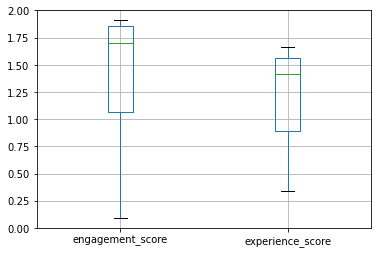

In [40]:
df.boxplot()

### K-means Clusturing

In [42]:
# scale data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df)
scaled_data

array([[-2.14766771, -1.47608776],
       [ 0.29118321,  0.63259664],
       [ 0.86262839,  0.61912019],
       ...,
       [ 0.85783584,  0.6344822 ],
       [-0.02991524,  0.84961932],
       [-2.14766771, -1.47608776]])

In [43]:
normalized_data = normalize(scaled_data)
normalized_data

array([[-0.82411963, -0.56641579],
       [ 0.4181293 ,  0.90838752],
       [ 0.81241419,  0.58308077],
       ...,
       [ 0.80398364,  0.59465142],
       [-0.03518837,  0.9993807 ],
       [-0.82411963, -0.56641579]])

In [44]:
kmeans = KMeans(n_clusters=2, random_state=1).fit(normalized_data)
kmeans.labels_

array([1, 0, 0, ..., 0, 0, 1])

In [45]:
user_satisfaction_df.insert(0, 'satisfaction_cluster', kmeans.labels_)
user_satisfaction_df

,satisfaction_cluster,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,,
3.360304e+10,1,0.152078,0.663077,0.407577
3.360304e+10,0,1.572003,1.476488,1.524246
3.360304e+10,0,1.904704,1.471290,1.687997
3.360304e+10,0,1.860896,1.243921,1.552409
3.360304e+10,1,0.428306,0.416743,0.422525
...,...,...,...,...
3.370000e+10,0,1.247188,1.620765,1.433977
3.370000e+10,0,1.836327,1.178141,1.507234
3.370000e+10,0,1.901914,1.477216,1.689565


In [46]:
user_satisfaction_df['satisfaction_cluster'].value_counts()

0    51280
1    37474
Name: satisfaction_cluster, dtype: int64

In [47]:
fig = px.scatter(user_satisfaction_df, x='engagement_score', y='experience_score',
                 color='satisfaction_cluster', size='satisfaction_score')
fig.show()

In [48]:
# average satisfaction & experience score per cluster
user_satisfaction_df.groupby('satisfaction_cluster').agg(
    {'satisfaction_score': 'mean', 'experience_score': 'mean'})

,satisfaction_score,experience_score
satisfaction_cluster,,
0,1.591282,1.492435
1,0.942783,0.876725


### Export dataframe to mysql

In [49]:
engine = create_engine('mysql+pymysql://root:@localhost/tellco')

ModuleNotFoundError: No module named 'pymysql'